# YouBike 2.0 Available Bikes Prediction

The project aims to predict the available bikes of YouBike 2.0 in `臺大專區` and `大安區` 。 The weather data source comes from `中央氣象局`.

## Import Packages

In [1]:
# Ignore warnings
import warnings

warnings.filterwarnings("ignore")

import os

# Set plot style
import matplotlib.pyplot as plt

plt.style.use("seaborn")

import seaborn as sns
from IPython.display import set_matplotlib_formats

%matplotlib inline
set_matplotlib_formats("svg")

# Numpy & Pandas
import numpy as np
import pandas as pd

# Load environmental variables
from dotenv import load_dotenv

load_dotenv()

True

## Read YouBike 2.0 Data with CSV Format

In [2]:
df = pd.read_csv("bike.csv", index_col=0)
df["time"] = pd.to_datetime(df["time"])
df

,name,time,lat,lng,stn_press,sea_press,temperature,td_dew_point,rh,ws,wd,ws_gust,wd_gust,precp,precp_hour,total_bike,available_bike
0,捷運忠孝復興站(5號出口),2021-12-29 22:14:10,25.04262,121.54443,1022.0,1025.6,17.4,14.7,84.0,2.7,100.0,6.0,100.0,0.0,0.0,21,1
1,捷運忠孝復興站(5號出口),2021-12-29 22:29:10,25.04262,121.54443,1022.0,1025.6,17.4,14.7,84.0,2.7,100.0,6.0,100.0,0.0,0.0,21,1
2,捷運忠孝復興站(5號出口),2021-12-29 22:44:10,25.04262,121.54443,1022.0,1025.6,17.4,14.7,84.0,2.7,100.0,6.0,100.0,0.0,0.0,21,1
3,捷運忠孝復興站(5號出口),2021-12-29 22:59:11,25.04262,121.54443,1022.0,1025.6,17.4,14.7,84.0,2.7,100.0,6.0,100.0,0.0,0.0,21,2
4,捷運忠孝復興站(5號出口),2021-12-29 23:14:09,25.04262,121.54443,1021.8,1025.5,17.0,14.5,85.0,1.6,100.0,6.2,70.0,0.0,0.0,21,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141479,忠孝東路三段217巷口,2022-01-15 22:59:10,25.04176,121.54027,1018.6,1022.2,16.8,13.3,80.0,2.8,100.0,7.5,120.0,0.0,0.0,14,2
141480,忠孝東路三段217巷口,2022-01-15 23:14:10,25.04176,121.54027,1018.0,1021.6,16.5,13.6,83.0,3.1,100.0,7.0,100.0,0.0,0.0,14,2
141481,忠孝東路三段217巷口,2022-01-15 23:29:10,25.04176,121.54027,1018.0,1021.6,16.5,13.6,83.0,3.1,100.0,7.0,100.0,0.0,0.0,14,2
141482,忠孝東路三段217巷口,2022-01-15 23:44:10,25.04176,121.54027,1018.0,1021.6,16.5,13.6,83.0,3.1,100.0,7.0,100.0,0.0,0.0,14,2


## EDA

### Insight - Station Traffic

Here we calculate station traffic with | available bikes in $\text{time}_{(t-1)}$ - available bikes in $\text{time}_{(t-2)}$ |

In [3]:
temp = {"station": [], "latitude": [], "longitude": [], "traffic": []}

previous_station = ""
previous_bikes = 0
station_traffic = 0

for index, row in df.iterrows():
    station_name = row["name"]
    available_bike = row["available_bike"]
    latitude = row["lat"]
    longitude = row["lng"]

    if station_name != previous_station:
        if previous_station != "":
            temp["station"].append(previous_station)
            temp["latitude"].append(latitude)
            temp["longitude"].append(longitude)
            temp["traffic"].append(station_traffic)
        previous_station = station_name
        previous_bikes = available_bike
        station_traffic = 0
    else:
        station_traffic += abs(available_bike - previous_bikes)

temp = pd.DataFrame(temp)
temp

,station,latitude,longitude,traffic
0,捷運忠孝復興站(5號出口),25.03336,121.53640,4846
1,捷運大安森林公園站(5號出口),25.03280,121.53746,4325
2,信義建國路口,25.03569,121.54510,2371
3,東豐公園,25.03473,121.54767,2421
4,德安公園(四維路66巷),24.34547,120.58721,3228
...,...,...,...,...
175,捷運忠孝敦化站(2號出口),25.04159,121.54937,4046
176,捷運忠孝敦化站(7號出口),25.03363,121.52962,4013
177,捷運東門站(5號出口),25.04196,121.53653,3019
178,臺北科技大學(電機工程系),25.04311,121.54313,1595


In [4]:
temp.sort_values(["traffic"], ascending=False).head(10)

,station,latitude,longitude,traffic
129,臺大大一女舍北側,25.01987,121.54175,13839
36,臨江街夜市(通化街101巷口),25.02370,121.54899,12860
128,臺大水源舍區B棟,25.01547,121.53436,10415
32,台北科技大學億光大樓,25.04003,121.53299,9517
107,捷運公館站(2號出口),25.02193,121.53165,8965
57,捷運麟光站(2號出口),25.01856,121.55558,8904
34,臨江街夜市(基隆路),25.02721,121.54988,7790
58,臥龍樂業街口,25.02100,121.55211,7251
45,建國和平路口西北側,25.02760,121.52217,6953
124,臺大水源舍區A棟,25.01881,121.53868,6889


##### Heatmap

In [5]:
import gmaps
import gmaps.datasets

GOOGLE_MAPS_API_KEY = os.getenv("gmaps_api")
gmaps.configure(api_key=GOOGLE_MAPS_API_KEY)

fig = gmaps.figure()

heatmap_layer = gmaps.heatmap_layer(
    temp[["latitude", "longitude"]], weights=temp["traffic"]
)
fig.add_layer(heatmap_layer)
fig

Figure(layout=FigureLayout(height='420px'))

### Time Series Check

#### All Stations

In [6]:
ax = df.plot(
    x="time",
    y="available_bike",
    style=".",
    figsize=(15, 5),
    title="Available bike in all stations",
)

plt.savefig("result/time_series_all.png", dpi=500, bbox_inches="tight")
plt.show()

#### Specific Station

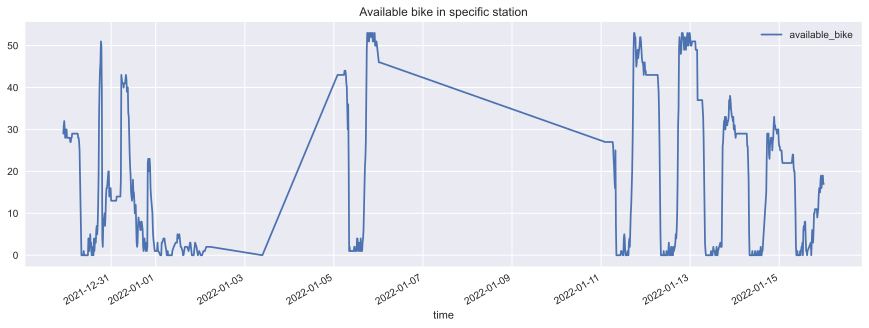

In [7]:
temp = df[df["name"] == "臺大大一女舍北側"]
ax = temp.plot(
    x="time", y="available_bike", figsize=(15, 5), title="Available bike in specific station"
)

plt.savefig("result/time_series_specific.png", dpi=500, bbox_inches="tight")
plt.show()

### Station information

#### History Available Bikes

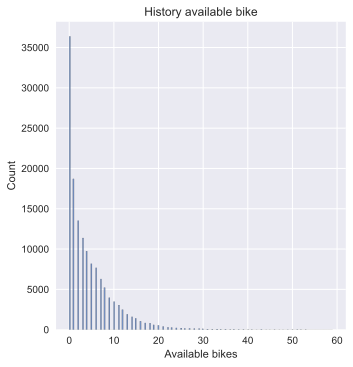

In [8]:
available_bike = df["available_bike"].dropna()
ax = sns.displot(available_bike)

plt.title("History available bike")
plt.xlabel("Available bikes")
plt.savefig("result/available_bike_dist.png", dpi=500, bbox_inches="tight")
plt.show()

#### Station Capability

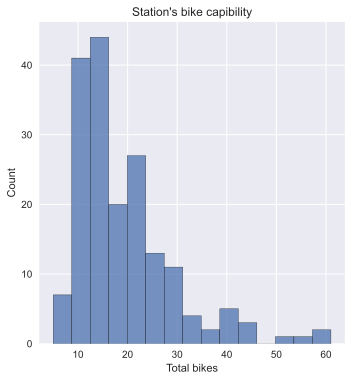

In [9]:
temp = []

previous_station = ""
for index, row in df.iterrows():
    station_name = row["name"]

    if station_name != previous_station:
        previous_station = station_name
        temp.append(row["total_bike"])
ax = sns.displot(temp)
plt.title("Station's bike capibility")
plt.xlabel("Total bikes")

plt.savefig("result/total_bike.png", dpi=500, bbox_inches="tight")
plt.show()

## Pre-procesing

In [10]:
df["hour"] = df["time"].dt.hour
df["dayofweek"] = df["time"].dt.dayofweek
df["month"] = df["time"].dt.month
df["year"] = df["time"].dt.year
df["dayofyear"] = df["time"].dt.dayofyear
df["dayofmonth"] = df["time"].dt.day

# Apply log transform to total_bike
df["total_bike"] = np.log10(df["total_bike"])
df

,name,time,lat,lng,stn_press,sea_press,temperature,td_dew_point,rh,ws,...,precp,precp_hour,total_bike,available_bike,hour,dayofweek,month,year,dayofyear,dayofmonth
0,捷運忠孝復興站(5號出口),2021-12-29 22:14:10,25.04262,121.54443,1022.0,1025.6,17.4,14.7,84.0,2.7,...,0.0,0.0,1.322219,1,22,2,12,2021,363,29
1,捷運忠孝復興站(5號出口),2021-12-29 22:29:10,25.04262,121.54443,1022.0,1025.6,17.4,14.7,84.0,2.7,...,0.0,0.0,1.322219,1,22,2,12,2021,363,29
2,捷運忠孝復興站(5號出口),2021-12-29 22:44:10,25.04262,121.54443,1022.0,1025.6,17.4,14.7,84.0,2.7,...,0.0,0.0,1.322219,1,22,2,12,2021,363,29
3,捷運忠孝復興站(5號出口),2021-12-29 22:59:11,25.04262,121.54443,1022.0,1025.6,17.4,14.7,84.0,2.7,...,0.0,0.0,1.322219,2,22,2,12,2021,363,29
4,捷運忠孝復興站(5號出口),2021-12-29 23:14:09,25.04262,121.54443,1021.8,1025.5,17.0,14.5,85.0,1.6,...,0.0,0.0,1.322219,3,23,2,12,2021,363,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141479,忠孝東路三段217巷口,2022-01-15 22:59:10,25.04176,121.54027,1018.6,1022.2,16.8,13.3,80.0,2.8,...,0.0,0.0,1.146128,2,22,5,1,2022,15,15
141480,忠孝東路三段217巷口,2022-01-15 23:14:10,25.04176,121.54027,1018.0,1021.6,16.5,13.6,83.0,3.1,...,0.0,0.0,1.146128,2,23,5,1,2022,15,15
141481,忠孝東路三段217巷口,2022-01-15 23:29:10,25.04176,121.54027,1018.0,1021.6,16.5,13.6,83.0,3.1,...,0.0,0.0,1.146128,2,23,5,1,2022,15,15
141482,忠孝東路三段217巷口,2022-01-15 23:44:10,25.04176,121.54027,1018.0,1021.6,16.5,13.6,83.0,3.1,...,0.0,0.0,1.146128,2,23,5,1,2022,15,15


## Split Data into Traning / Validation / Testing

Here we split data into training (60%) and validation (20%) and testing (20%)

In [11]:
from sklearn.model_selection import train_test_split

features = list(df.columns)
# Drop name & time
features.remove("name")
features.remove("time")
# available_bike as y
features.remove("available_bike")

selected_X = df[features]
y = df["available_bike"]
# Training / Testing
X_train, X_test, y_train, y_test = train_test_split(selected_X, y, test_size=0.2, random_state=2021)
# Training / Validation
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=2021)

# Display shape size
pd.DataFrame({"Train shape": [X_train.shape], "Validation shape": [X_val.shape], "Test shape": [X_test.shape]})

,Train shape,Validation shape,Test shape
0,"(84890, 20)","(28297, 20)","(28297, 20)"


## Build Model with XGBoost

In [12]:
from xgboost import XGBRegressor

n_estimators = 610
max_depth = 10
min_child_weight = 9
gamma = 0.16
subsample = 1.0
colsample_bytree = 0.8
eta = 0.19

eval_set = [(X_train, y_train), (X_val, y_val)]
eval_metric = ["rmse"]

# Build Model
model = XGBRegressor(
    booster="gbtree",
    objective="reg:squarederror",
    n_estimators=n_estimators,
    max_depth=max_depth,
    min_child_weight=min_child_weight,
    gamma=gamma,
    subsample=subsample,
    colsample_bytree=colsample_bytree,
    eta=eta,
)


model.fit(
    X_train,
    y_train,
    eval_metric=eval_metric,
    eval_set=eval_set,
    verbose=False,
)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8, enable_categorical=False,
             eta=0.19, gamma=0.16, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.189999998,
             max_delta_step=0, max_depth=10, min_child_weight=9, missing=nan,
             monotone_constraints='()', n_estimators=610, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1.0,
             tree_method='exact', validate_parameters=1, verbosity=None)

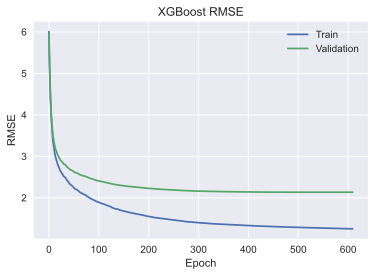

In [13]:
eval_result = model.evals_result()
epochs = len(eval_result["validation_0"]["rmse"])
x_axis = range(0, epochs)

fig, ax = plt.subplots()
ax.plot(x_axis, eval_result["validation_0"]["rmse"], label="Train")
ax.plot(x_axis, eval_result["validation_1"]["rmse"], label="Validation")
ax.legend()
plt.xlabel("Epoch")
plt.ylabel("RMSE")
plt.title("XGBoost RMSE")
plt.savefig("result/rmse.png", dpi=500, bbox_inches="tight")
plt.show()

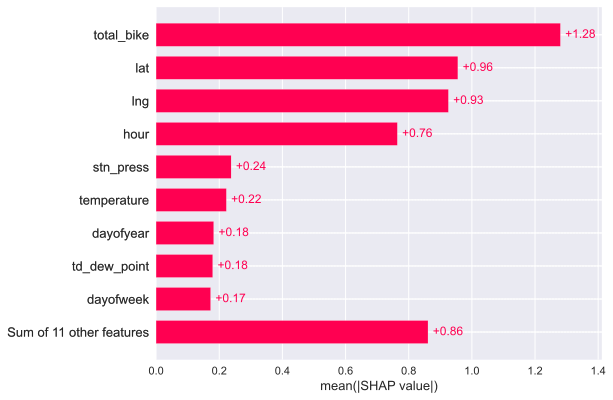

In [14]:
import shap


explainer = shap.Explainer(model)
shap_values = explainer(X_val)
shap.plots.bar(shap_values, show=False)
plt.savefig("result/weight.png", dpi=500, bbox_inches="tight")

## Evaluate Model Performance

In [15]:
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# Train data
y_train_pred = model.predict(X_train)
# Validation data
y_val_pred = model.predict(X_val)
# Test data
y_test_pred = model.predict(X_test)

result = {"Indicator": ["R2 Score", "Adjusted R2 Score", "RMSE", "MAE"], "Train score": [], "Validation score": [], "Test score": []}

# R2 Score
r2_train = r2_score(y_train, y_train_pred)
r2_val = r2_score(y_val, y_val_pred)
r2_test = r2_score(y_test, y_test_pred)
result["Train score"].append(r2_train)
result["Validation score"].append(r2_val)
result["Test score"].append(r2_test)

# Adjusted R2
def adjust_r2(X, score):
    result = 1 - (1 - score) * ((X.shape[0] - 1) / (X.shape[0] - X.shape[1] - 1))
    return result

result["Train score"].append(adjust_r2(X=X_train, score=r2_train))
result["Validation score"].append(adjust_r2(X=X_val, score=r2_val))
result["Test score"].append(adjust_r2(X=X_test, score=r2_test))

# RMSE
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_val = np.sqrt(mean_squared_error(y_val, y_val_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

result["Train score"].append(rmse_train)
result["Validation score"].append(rmse_val)
result["Test score"].append(rmse_test)


# Mean Absolute Error
mae_train = mean_absolute_error(y_train, y_train_pred)
mae_val = mean_absolute_error(y_val, y_val_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)

result["Train score"].append(mae_train)
result["Validation score"].append(mae_val)
result["Test score"].append(mae_test)

pd.DataFrame(result)

,Indicator,Train score,Validation score,Test score
0,R2 Score,0.950247,0.852079,0.855393
1,Adjusted R2 Score,0.950235,0.851974,0.855290
2,RMSE,1.252258,2.134919,2.100245
3,MAE,0.731700,1.276037,1.263304


### Testing Data

<Figure size 1080x360 with 0 Axes>

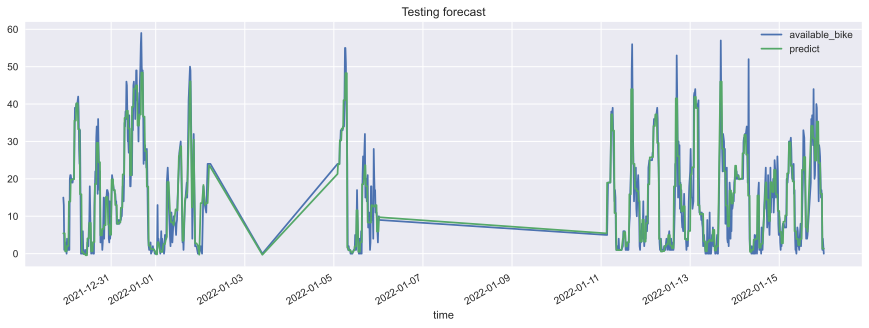

In [16]:
temp = df[df["name"] == "捷運公館站(2號出口)"]

plt.figure(figsize=(15, 5))

temp["predict"] = model.predict(temp[features])

ax = temp.plot(
    x="time", y="available_bike", figsize=(15, 5), title="Testing forecast"
)

temp.plot(
    x="time", y="predict", ax=ax
)
plt.savefig("result/testing.png", dpi=500, bbox_inches="tight")
plt.show()